# Double Pendulum Using Lagrange's Equation

This program defines a DoublePendulum class that solves Lagrange's equations of motion for a simple double pendulum. Plots of the double pendulum's motion are also generated and tested for chaotic motion.

In [4]:
%matplotlib inline

In [5]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

In [6]:
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook

# Change the common font size (smaller when higher dpi)
font_size = 10
plt.rcParams.update({'font.size': font_size})

## Double Pendulum Class and Utility Functions

In [7]:
class DoublePendulum():
    """
    This class uses Lagrange's equations to find the positions over time of two bobs in a simple
    double pendulum (simple meaning no driving or damping forces)
    
    Parameters
    ----------
    L1 : float
        length of first pendulum
    L2 : float
        length of second pendulum
    g : float
        gravitational acceleration at the earth's surface
    m1 : float
        mass of first pendulum bob
    m2 : float
        mass of second pendulum bob
        
    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    """
    def __init__(self, L1=1., L2=1., m1=1., m2=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.m1 = m1
        self.m2 = m2
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dtheta1/dt d^2theta1/dt^2 dtheta2/dt d^2theta2/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 4-component vector with 
            y[0] = theta1(t) and y[1] = dtheta1(t)/dt
            y[2] = theta2(t) and y[3] = dtheta2(t)/dt
            
        Returns
        -------
        
        """
        
        # Simplify terms
        c = np.cos(y[0] - y[2])
        s = np.sin(y[0] - y[2])
        
        return y[1], ( self.m2 * self.g * np.sin(y[2]) * c \
                       - self.m2 * s * ( self.L1 * y[1]**2. \
                       * c + self.L2 * y[3]**2. ) \
                       - (self.m1 + self.m2) * self.g * np.sin(y[0]) ) \
                       / ( self.L1 * ( self.m1 + self.m2 * s**2.) ), \
                y[3], ( (self.m1 + self.m2) * ( self.L1 * y[1]**2. * s - self.g \
                       * np.sin(y[2]) + self.g * np.sin(y[0]) * c ) \
                       + self.m2 * self.L2 * y[3]**2. * s * c ) \
                       / ( self.L2 * ( self.m1 + self.m2 * s**2. ) )
    
    def solve_ode(self, t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, 
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        theta1, theta1_dot, theta2, theta2_dot = solution.y

        return theta1, theta1_dot, theta2, theta2_dot 

In [8]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [9]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Pendulum Position Plot

In [30]:
# Labels for individual plot axes
theta1_vs_time_labels = (r'$t$', r'$\theta_1(t)$')
theta2_vs_time_labels = (r'$t$', r'$\theta_2(t)$')
theta_vs_time_labels = (r'$t$', r'$\theta(t)$')
# state_space_labels1 = (r'$\theta_1$', r'$d\theta_1/dt$')  # Could be used to test for chaotic motion
# state_space_labels2 = (r'$\theta_2$', r'$d\theta_2/dt$')

# Time range of plot
t_start = 0.
t_end = 50.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Define parameters for double pendulum
L1 = 1.
L2 = 1.
g = 1.
m1 = 1.
m2 = 1.

# Instantiate a double pendulum 
p1 = DoublePendulum(L1=L1, L2=L2, m1=m1, m2=m2, g=g)


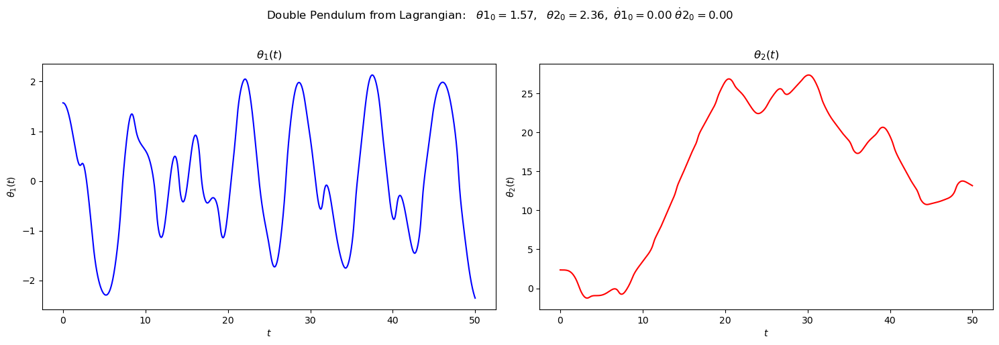

In [31]:
# Define initial conditions
theta1_0 = (1./2.)*np.pi
theta2_0 = (3./4.)*np.pi
theta1_dot_0 = 0.
theta2_dot_0 = 0.

# Solve for position of pendulum bobs
theta1, theta1_dot, theta2, theta2_dot = p1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)

# start the plot!
fig = plt.figure(figsize=(15,5))
overall_title = 'Double Pendulum from Lagrangian:  ' + \
                rf' $\theta1_0 = {theta1_0:.2f},$' + \
                rf'  $\theta2_0 = {theta2_0:.2f},$' + \
                rf' $\dot\theta1_0 = {theta1_dot_0:.2f}$' + \
                rf' $\dot\theta2_0 = {theta2_dot_0:.2f}$'

fig.suptitle(overall_title, va='baseline')
    
# first plot: theta 1 plot 
ax_a = fig.add_subplot(1,2,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta1_vs_time_labels, 
            color='blue',
            label=None, 
            title=r'$\theta_1(t)$', 
            ax=ax_a)    
                              
# second plot: theta 2 plot 
ax_b = fig.add_subplot(1,2,2)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta2_vs_time_labels, 
            color='red',
            label=None, 
            title=r'$\theta_2(t)$', 
            ax=ax_b)    

fig.tight_layout()
fig.savefig('double_pendulum_Lagrange.jpeg', bbox_inches='tight')  

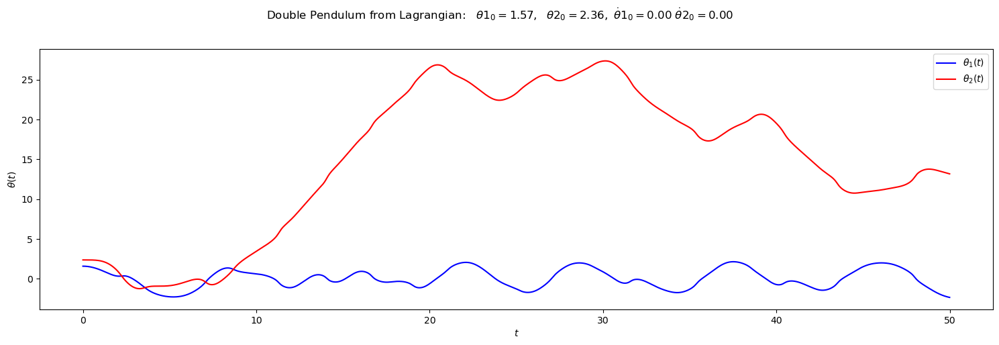

In [32]:
# third plot: theta 1 and 2 combined
fig2 = plt.figure(figsize=(15,5))

fig2.suptitle(overall_title, va='baseline')
     
ax_c = fig2.add_subplot(1,1,1)                 

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label=r'$\theta_1(t)$',  
            ax=ax_c)
plot_y_vs_x(t_pts[start : stop], theta2[start : stop],  
            color='red',
            label=r'$\theta_2(t)$',  
            ax=ax_c)

fig2.tight_layout()
fig2.savefig('double_pendulum_Lagrange_combined.jpeg', bbox_inches='tight') 

## Testing for Chaotic Motion

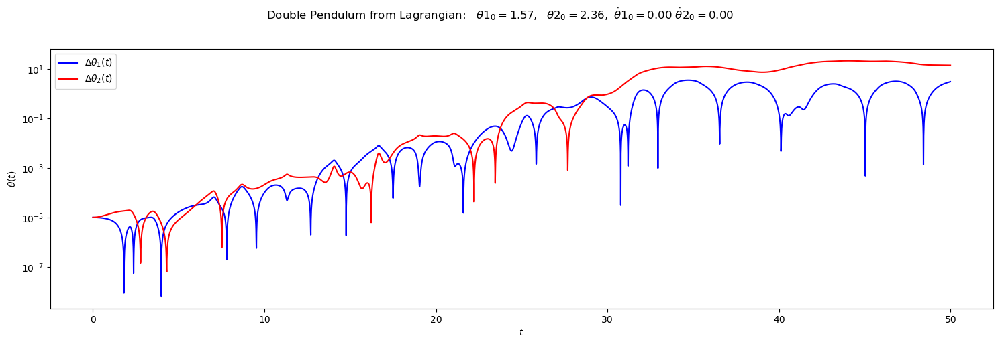

In [33]:
# Solve for position of an identical pendulum with slightly different initial conditions
theta1_mod, theta1_dot_mod, theta2_mod, theta2_dot_mod = \
                    p1.solve_ode(t_pts, theta1_0-0.00001, theta1_dot_0, theta2_0-0.00001, theta2_dot_0)

fig3 = plt.figure(figsize=(15,5))

fig3.suptitle(overall_title, va='baseline')
     
ax_d = fig3.add_subplot(1,1,1)                 

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(theta1[start : stop] - theta1_mod[start : stop]), 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            semilogy=True,
            label=r'$\Delta\theta_1(t)$',  
            ax=ax_d)
plot_y_vs_x(t_pts[start : stop], np.abs(theta2[start : stop] - theta2_mod[start : stop]),  
            color='red',
            semilogy=True,
            label=r'$\Delta\theta_2(t)$',  
            ax=ax_d)

fig3.tight_layout()
fig3.savefig('double_pendulum_Lagrange_chaotic.jpeg', bbox_inches='tight') 


## Chaotic Motion Discussion

   The previous plot shows that over time, the difference in position of two identical double pendulums
with only slightly different initial conditions grows nearly exponentially. In other words, the two 
identical pendulums never converge to the same motion. This initial condition sensitivity
is an indicator of chaotic motion.

## Animated Double Pendulum

In [34]:
def bob_position(x0, y0, theta, L):
    """
    Defines pendulum bob position given length L, angle theta, and pendulum's initial point (x0, y0)
    
    """
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x, y

In [35]:
%%capture

fig_anim = plt.figure(figsize=(5,5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(-3., 3.)
ax_anim.set_ylim(-3., 3.)

# Initialize bodies to be animated
x0, y0 = 0., 0.  # Point of connection between pendulum and fixed surface
fxd_pt_anim, = ax_anim.plot(x0, y0, 'o', markersize=6, color='black')

x1, y1 = bob_position(x0, y0, theta1[0], p1.L1) # First bob position
pt1_anim, = ax_anim.plot(x1, y1, 'o', markersize=12, color='blue')

x2, y2 = bob_position(x1, y1, theta2[0], p1.L2) # Second bob position
pt2_anim, = ax_anim.plot(x2, y2, 'o', markersize=12, color='blue')

ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3) # Line representing pendulum 1
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3) # Line representing pendulum 2

# Repeat for identical pendulum with slightly different initial conditions
x1b, y1b = bob_position(x0, y0, theta1_mod[0], p1.L1)
pt1b_anim, = ax_anim.plot(x1b, y1b, 'o', markersize=12, color='purple')

x2b, y2b = bob_position(x1b, y1b, theta2_mod[0], p1.L2)
pt2b_anim, = ax_anim.plot(x2b, y2b, 'o', markersize=12, color='purple')

ln1b_anim, = ax_anim.plot([x0, x1b], [y0, y1b], color='purple', lw=3)
ln2b_anim, = ax_anim.plot([x1b, x2b], [y1b, y2b], color='purple', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [49]:
def animate_pendulum(i):
    """
    This function is called by FuncAnimation to iterate the points and lines representing the bobs and pendulums
    
    """
    i_skip = 2 * i
    
    x0, y0 = 0., 0.
    fxd_pt_anim.set_data(x0, y0)

    x1, y1 = bob_position(x0, y0, theta1[i_skip], p1.L1)
    pt1_anim.set_data(x1, y1)

    x2, y2 = bob_position(x1, y1, theta2[i_skip], p1.L2)
    pt2_anim.set_data(x2, y2)

    ln1_anim.set_data([x0, x1], [y0, y1])
    ln2_anim.set_data([x1, x2], [y1, y2])
    
    x1b, y1b = bob_position(x0, y0, theta1_mod[i_skip], p1.L1)
    pt1b_anim.set_data(x1b, y1b)

    x2b, y2b = bob_position(x1b, y1b, theta2_mod[i_skip], p1.L2)
    pt2b_anim.set_data(x2b, y2b)

    ln1b_anim.set_data([x0, x1b], [y0, y1b])
    ln2b_anim.set_data([x1b, x2b], [y1b, y2b])
    
    return (fxd_pt_anim, pt1_anim, pt2_anim, ln1_anim, ln2_anim, pt1b_anim, pt2b_anim, ln1b_anim, ln2b_anim)

In [52]:
frame_interval = 20.
frame_number = 2001
anim = animation.FuncAnimation(fig_anim,
                               animate_pendulum,
                               init_func=None,
                               frames=frame_number,
                               interval=frame_interval,
                               blit=True,
                               repeat=False)

In [53]:
HTML(anim.to_jshtml())